In [1]:
from torchvision import transforms
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from importlib import reload
import random

# import data.imagenet
# reload(data.imagenet)
# import data.imagereward
# reload(data.imagereward)
# import data.cub
# import data.coco

from utils_vis import no_axes, tf_img

/tmlscratch/fcroce/miniconda3/envs/env1v2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [263]:
import data.two_afc.night
reload(data.two_afc.night)

preprocess = lambda x: x

ds = data.two_afc.night.NightDataset(
    root_dir='/tmlscratch/fcroce/datasets/',
    image_processor=preprocess,
    split='test'
)
len(ds)

1824

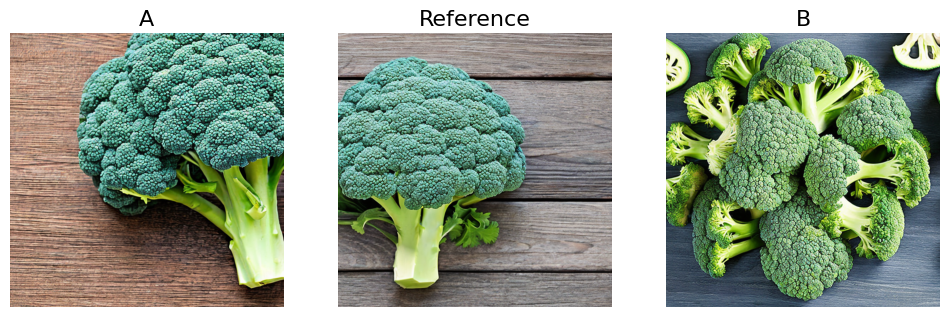

10 A


In [280]:
# Visualize triplets.

# i = -1
# i += 1
i = 10
l = ds[i]
fs = 16

fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(l[1])
ax[1].imshow(l[0])
ax[2].imshow(l[2])
ax[0].set_title('A', fontsize=fs)
ax[1].set_title('Reference', fontsize=fs)
ax[2].set_title('B', fontsize=fs)
#ax[0 if l[3] == 0 else 2].set_title('GT')

no_axes(ax)
#fig.suptitle(f'idx={i} prompt={l[3][:100]}')

no_axes(ax)

plt.show()

print(i, 'A' if l[3] == 0 else 'B')

In [60]:
# Odd-one-out datasets.

import data.three_afc.imagenet
reload(data.three_afc.imagenet)

preprocess = transforms.Compose([
            transforms.Resize((336, 336),
                              interpolation=transforms.InterpolationMode.BICUBIC),
            transforms.ToTensor()
])
# preprocess = lambda x: x

# ds = data.cifar.CIFAR100CoarseTriplets(
#     root=args.data_dir,
#     train=False,
#     transform=preprocess_orig,
#     download=False,
#     verbose=True)

random.seed(1)

ds = data.three_afc.imagenet.HardImageNetTriplets(
    data_dir='/tmlscratch/fcroce/datasets/',
    split='val',
    transforms_fn=preprocess,
    verbose=True,
)
print(ds.class_names)

#loader = DataLoader(ds, batch_size=1, num_workers=0, shuffle=False)
print(len(ds))
i = -1

['aquatic animals', 'terrestrial animals', 'clothes', 'transportations', 'places', 'musical instruments']
50000


In [ ]:
# Visualize triplets.

rows = 5
fig, ax = plt.subplots(rows, 3, figsize=(12, 4 * rows))

ds.return_indiv_labels = True

for e, l in enumerate(loader):
    for i in range(3):
        ax[e, i].imshow(l[i].squeeze().permute(1, 2, 0).cpu().numpy(), interpolation='none')
        ax[e, i].set_title(l[5][i][0] if l[3].item() != i else l[5][i][0] + ' -- GT')
    if e == (rows - 1):
        break
no_axes(ax)

plt.show()

coarse_classes=['places', 'terrestrial animals', 'terrestrial animals']
expected=['castle', 'Indian cobra', 'leaf beetle']
sampled=['castle', 'Indian cobra', 'leaf beetle']


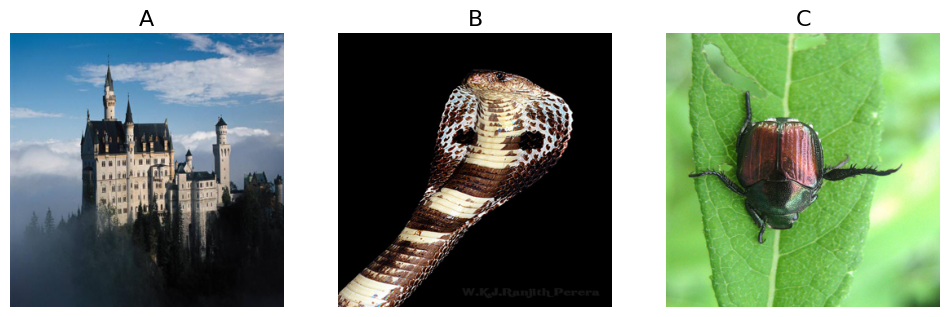

0 A


In [61]:
i += 1
#i = 10
l = ds[i]
fs = 16

fig, ax = plt.subplots(1, 3, figsize=(12, 4))

ax[0].imshow(tf_img(l[0]))
ax[1].imshow(tf_img(l[1]))
ax[2].imshow(tf_img(l[2]))
ax[0].set_title('A', fontsize=fs)
ax[1].set_title('B', fontsize=fs)
ax[2].set_title('C', fontsize=fs)
#ax[0 if l[3] == 0 else 2].set_title('GT')

no_axes(ax)
#fig.suptitle(f'idx={i} prompt={l[3][:100]}')
plt.subplots_adjust(wspace=.2, hspace=.15)

no_axes(ax)

plt.show()

print(i, ['A', 'B', 'C'][l[3]])

In [427]:
# ImageReward pairs.
import data.text_images_afc.imagereward
reload(data.text_images_afc.imagereward)

ds = data.text_images_afc.imagereward.ImageRewardPairs(
    data_dir='/tmlscratch/fcroce/datasets/',
    img_prepr=lambda x: x,
    text_prepr=None,
    split='validation',
    verbose=True,
)
print(len(ds))  # number of different prompts
i = -1

412


In [401]:
import data.text_images_afc.hpdv2
reload(data.text_images_afc.hpdv2)

ds = data.text_images_afc.hpdv2.HPDv2Pairs(
    data_dir='/tmlscratch/fcroce/datasets/',
    img_prepr=lambda x: x,
    text_prepr=None,
    split='validation',
    verbose=True,
)
print(len(ds))  # number of different prompts
i = -1

400
400
400


selected images [631, 625] rank 1=4 rank 2=1 label=1


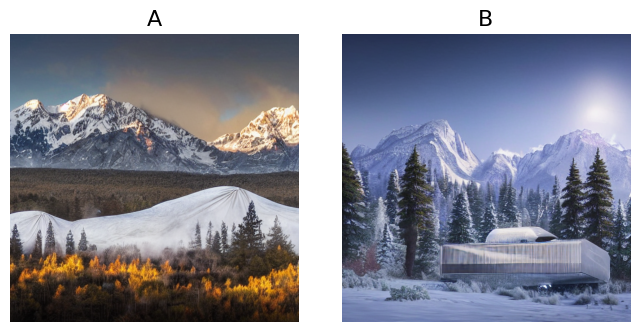

8 1 an expansive view of a futuristic containment building in a forested valley and snow - capped mountains in the distance, national geographic, hyper realistic, 4 k, dusty light 


In [508]:
i += 1
i = 8
l = ds[i]

fs = 16

fig, ax = plt.subplots(1, 2, figsize=(8, 5))

ax[0].imshow(l[0])
ax[1].imshow(l[1])
ax[0].set_title('A', fontsize=fs)
ax[1].set_title('B', fontsize=fs)
#ax[l[2]].set_title('GT (better rank)')

no_axes(ax)
# fig.suptitle(f'idx={i} prompt={l[3][:100]}')
plt.subplots_adjust(wspace=.15, #hspace=0
                    )

plt.show()

print(i, l[2], l[3]) 

In [2]:
reload(data.cub)
ds = data.cub.CUB200Pairs(
    '/tmlscratch/fcroce/datasets/cub/',
    split='test',
    verbose=True)
len(ds)
i = -1

true=Black_footed_Albatross, Black_throated_Sparrow


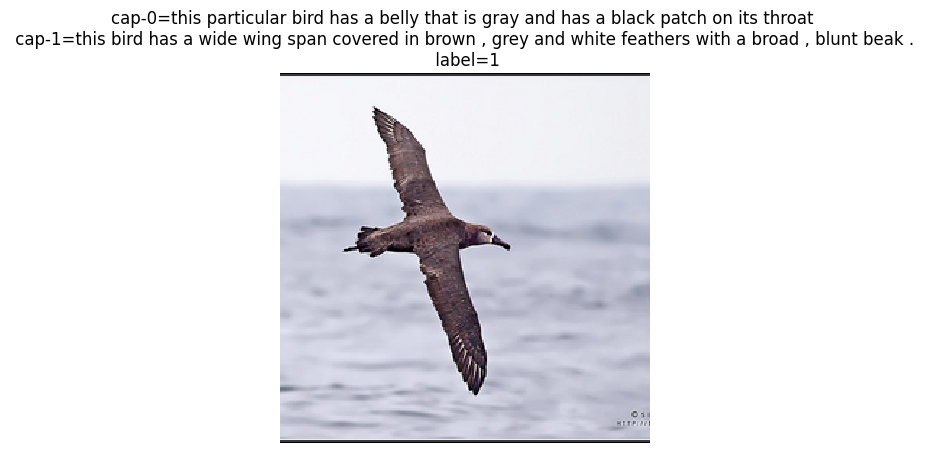

In [4]:
i += 1
l = ds[i]

fig, ax = plt.subplots(1, 1)
ax.imshow(l[0].permute(1, 2, 0), interpolation='none')
ax.set_title(f'cap-0={l[1]} \n cap-1={l[2]} \n label={l[3]}')
no_axes(ax)

plt.show()

In [8]:
reload(data.coco)
ds = data.coco.CocoPairs(
    '/tmlscratch/fcroce/datasets/coco/images/val2014/',
    captions_path='/tmlscratch/fcroce/datasets/resources/all_captions_extended.csv',
    scores_path='/tmlscratch/fcroce/datasets/resources/expert_worker_results_extended.csv',
    transform_fn=None,
    verbose=True,
    min_score=3,  # 2, 3
)
print(len(ds))
i = -1

156


Our 3 a group of three people riding an elephant through a forest.
ViT-GPT2 0 a man and a woman riding an elephant through a jungle 
0


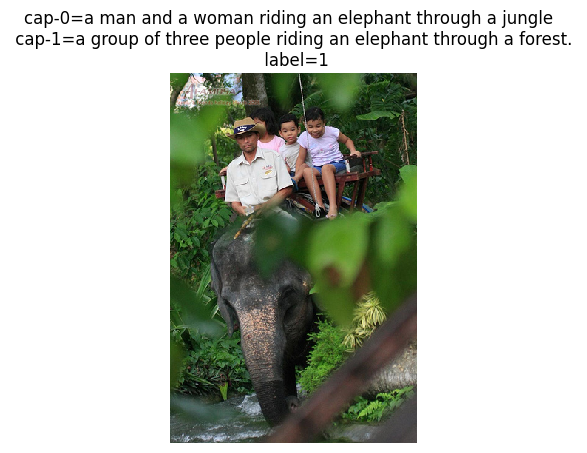

In [9]:
i += 1
l = ds[i]
print(i)

fig, ax = plt.subplots(1, 1)
ax.imshow(l[0], interpolation='none')
ax.set_title(f'cap-0={l[1]} \n cap-1={l[2]} \n label={l[3]}')
no_axes(ax)

plt.show()

In [281]:
import data.text_2afc.hq_edit

In [283]:
reload(data.text_2afc.hq_edit)

preprocess = lambda x: x

ds = data.text_2afc.hq_edit.HQEdit(
            data_dir='/tmlscratch/fcroce/datasets/',
            img_prepr=preprocess,
            text_prepr=None,
            split='val',
            task_type='text_2afc',
            instruct=None)

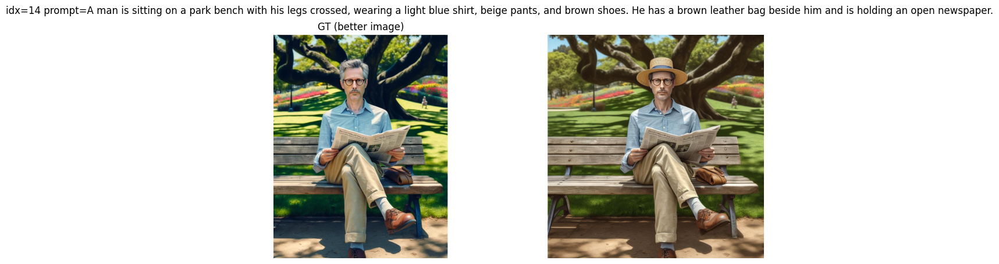

In [37]:
i = 14
l = ds[i]

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

ax[0].imshow(l[0])
ax[1].imshow(l[1])
ax[l[2]].set_title('GT (better image)')

no_axes(ax)
fig.suptitle(f'idx={i} prompt={l[3]}')

plt.show()

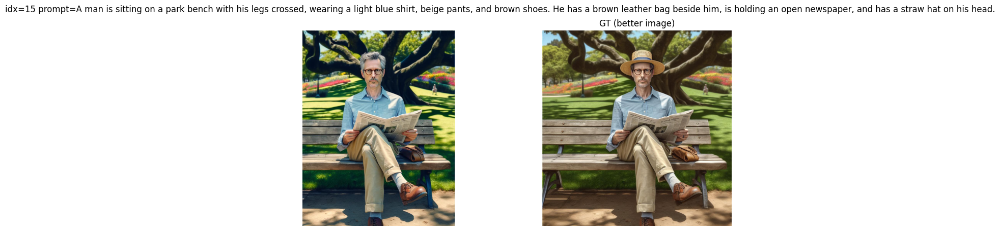

In [38]:
i = 15
l = ds[i]

fig, ax = plt.subplots(1, 2, figsize=(12, 5))

ax[0].imshow(l[0])
ax[1].imshow(l[1])
ax[l[2]].set_title('GT (better image)')

no_axes(ax)
fig.suptitle(f'idx={i} prompt={l[3]}')

plt.show()

In [284]:
reload(data.text_2afc.hq_edit)

preprocess = lambda x: x

ds = data.text_2afc.hq_edit.HQEdit(
            data_dir='/tmlscratch/fcroce/datasets/',
            img_prepr=preprocess,
            text_prepr=None,
            split='val',
            task_type='text_2afc',
            instruct=None)
len(ds)

2000

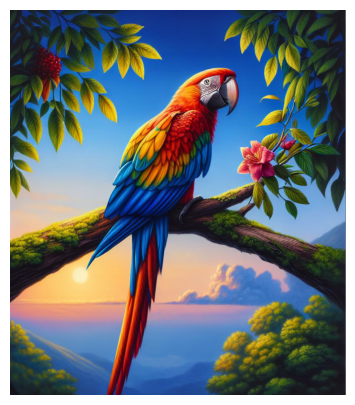

92
cap-A: a brightly colored parrot perched on a tree branch with a clear blue sky and the sun setting in the background
cap-B: a brightly colored parrot perched on a tree branch against a starry night sky with enhanced vibrant colors
label: 0


In [344]:
# i = -1
# i -= 2
i = 92
l = ds[i]
fs = 16

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(l[0])
#ax[0 if l[3] == 0 else 2].set_title('GT')

no_axes(ax)
#fig.suptitle(f'idx={i} prompt={l[3][:100]}')

no_axes(ax)

plt.show()

print(i)
print(f'cap-A: {l[1]}\ncap-B: {l[2]}\nlabel: {l[3]}')

In [581]:
import data.iqa.kadid10k
reload(data.iqa.kadid10k)

preprocess = lambda x: x

random.seed(0)

ds = data.iqa.kadid10k.KADID10kPairs(
    root_dir='/tmlscratch/fcroce/datasets/',
    transform_fn=preprocess,
    split='test',
    sampling_mode='easy-sev-noref',
)
len(ds)
i = -1

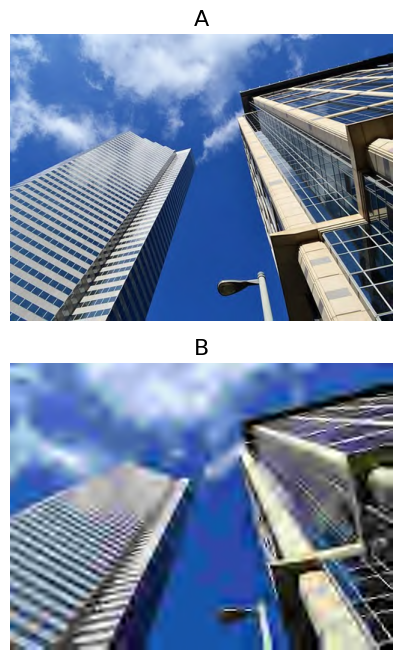

1 0 [1, 5]


In [583]:
i += 1

l = ds[i]

fs = 16

fig, ax = plt.subplots(2, 1, figsize=(5, 8))

ax[0].imshow(l[0])
ax[1].imshow(l[1])
ax[0].set_title('A', fontsize=fs)
ax[1].set_title('B', fontsize=fs)
#ax[l[2]].set_title('GT (better rank)')

no_axes(ax)
# fig.suptitle(f'idx={i} prompt={l[3][:100]}')
plt.subplots_adjust(wspace=0, hspace=.15
                    )

plt.show()

print(i, l[2], l[3]) 

In [2]:
import data.iqa.sice
reload(data.iqa.sice)

preprocess = lambda x: x

random.seed(0)

ds = data.iqa.sice.SICEPairs(
    data_dir='/tmlscratch/fcroce/datasets/',
    transform_fn=preprocess,
    split='test',
)
len(ds)
i = -1

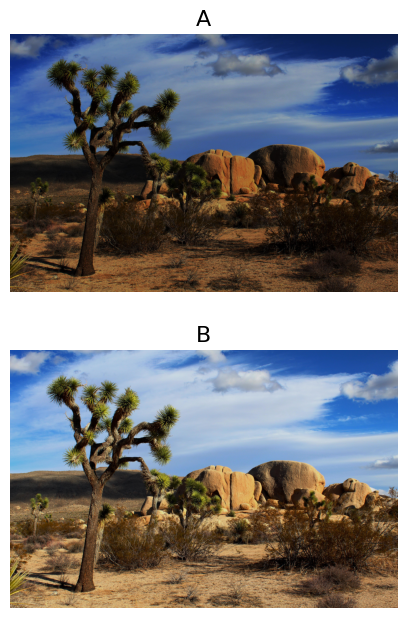

6 1 [68, 118]


In [9]:
i += 1  # 6

l = ds[i]

fs = 16

fig, ax = plt.subplots(2, 1, figsize=(5, 8))

ax[0].imshow(l[0])
ax[1].imshow(l[1])
ax[0].set_title('A', fontsize=fs)
ax[1].set_title('B', fontsize=fs)
#ax[l[2]].set_title('GT (better rank)')

no_axes(ax)
# fig.suptitle(f'idx={i} prompt={l[3][:100]}')
plt.subplots_adjust(wspace=0, hspace=.05
                    )

plt.show()

print(i, l[2], l[3]) 

In [10]:
import data.iqa.koniq10k
reload(data.iqa.koniq10k)

preprocess = lambda x: x

random.seed(0)

ds = data.iqa.koniq10k.KonIQ10kPairs(
    data_dir='/tmlscratch/fcroce/datasets/',
    transform_fn=preprocess,
    split='test',
    attribute='colorfulness',
    sampling_mode='rand-all',
)
len(ds)
i = -1

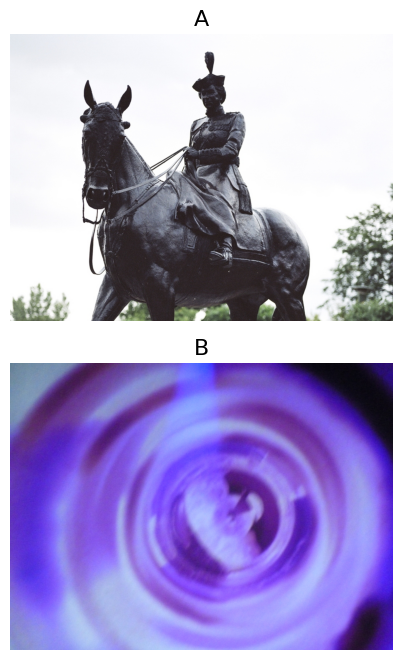

20 1 [0.021386727, 0.360716586]


In [31]:
i += 1

l = ds[i]

fs = 16

fig, ax = plt.subplots(2, 1, figsize=(5, 8))

ax[0].imshow(l[0])
ax[1].imshow(l[1])
ax[0].set_title('A', fontsize=fs)
ax[1].set_title('B', fontsize=fs)
#ax[l[2]].set_title('GT (better rank)')

no_axes(ax)
# fig.suptitle(f'idx={i} prompt={l[3][:100]}')
plt.subplots_adjust(wspace=0, hspace=.15
                    )

plt.show()

print(i, l[2], l[3]) 

In [21]:
import data.retrieval.roxford_rparis
reload(data.retrieval.roxford_rparis)

preprocess = lambda x: x

random.seed(0)

ds_train = data.retrieval.roxford_rparis.OxfordParisDataset(
    dir_main='/tmlscratch/fcroce/datasets/revisitop',
    transform=preprocess,
    split='train',
    dataset='roxford5k',
)
print(len(ds_train))

ds = data.retrieval.roxford_rparis.OxfordParisDataset(
    dir_main='/tmlscratch/fcroce/datasets/revisitop',
    transform=preprocess,
    split='query',
    dataset='roxford5k',
)
print(len(ds))
i = -1

4993
70


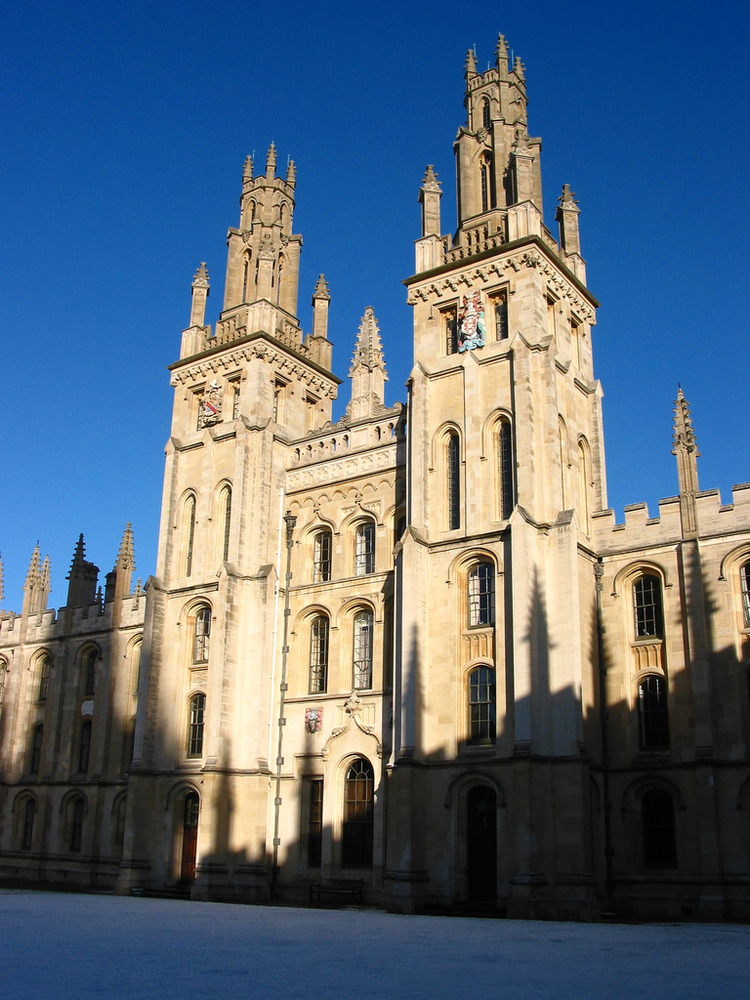

In [50]:
img_idx = 0
im, idx = ds[img_idx]
im.show()

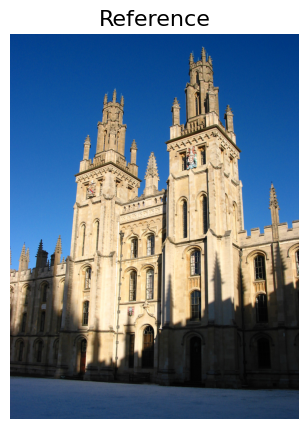

In [90]:
l = ds[i]
fs = 16

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

ax.imshow(im)
ax.set_title('Reference', fontsize=fs)

no_axes(ax)
#fig.suptitle(f'idx={i} prompt={l[3][:100]}')

no_axes(ax)

plt.show()

In [20]:
len(ds.cfg['gnd'][0]['junk'])

33

In [55]:
pool = [ds_train[i][0] for i in ds.cfg['gnd'][img_idx]['easy']]

In [82]:
max(random.sample(list(range(70)), k=20))

69

In [88]:
pool_other = [
    ds_train[random.choice(
        ds.cfg['gnd'][i]['easy'] + ds.cfg['gnd'][i]['easy']
        )][0] for i in random.sample(range(70), k=20)]

In [ ]:
for i in range(70):
    print(len(ds.cfg['gnd'][i]['hard']))

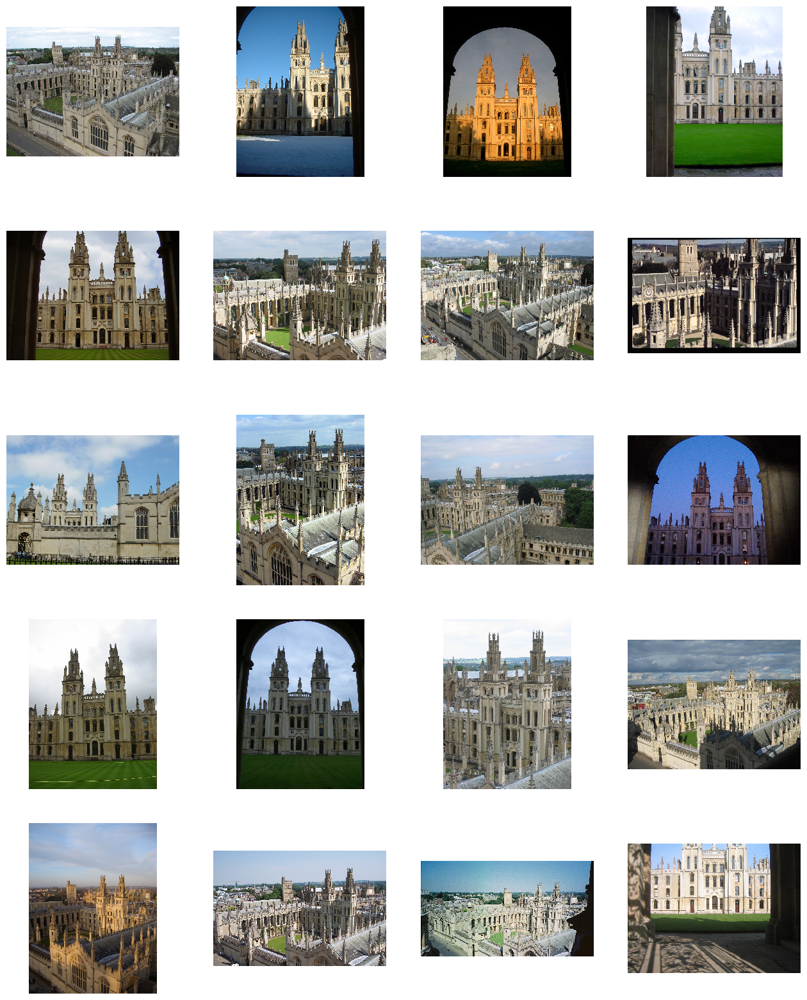

In [52]:
rows = 5
col = 4
fig, ax = plt.subplots(rows, col, figsize=(4 * col, 4 * rows))

ds.return_indiv_labels = True

for e, l in enumerate(pool):
    ax[e // col, e % col].imshow(l, interpolation='none')
    #ax[e, i].set_title(l[5][i][0] if l[3].item() != i else l[5][i][0] + ' -- GT')
    if e == (rows * col - 1):
        break
no_axes(ax)

plt.show()

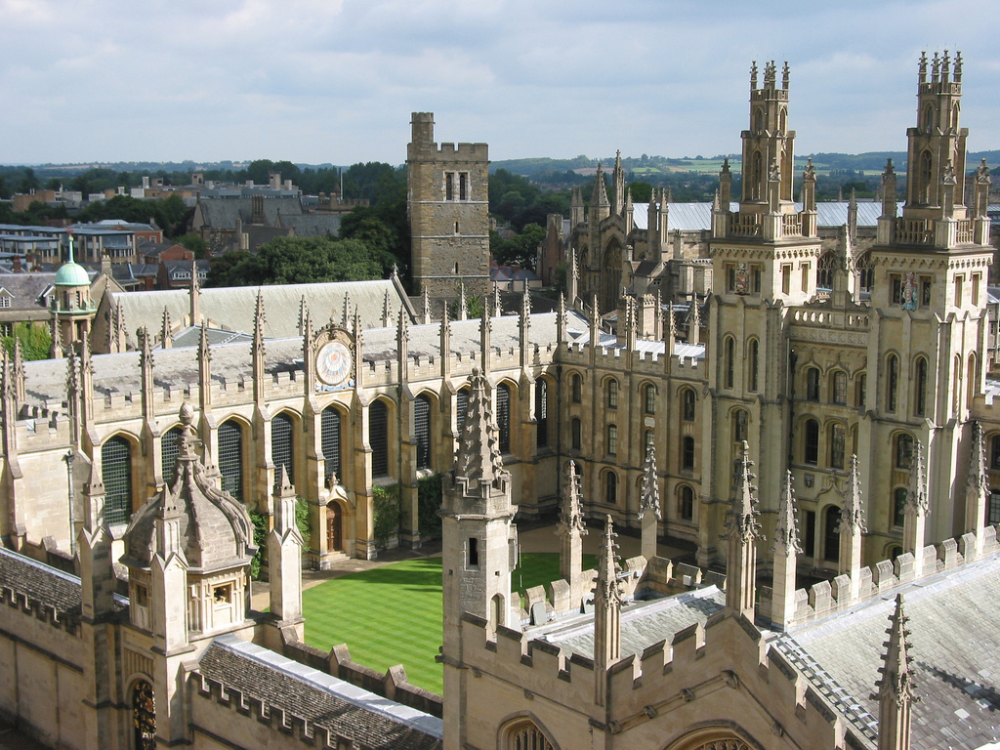

In [92]:
pool[5]

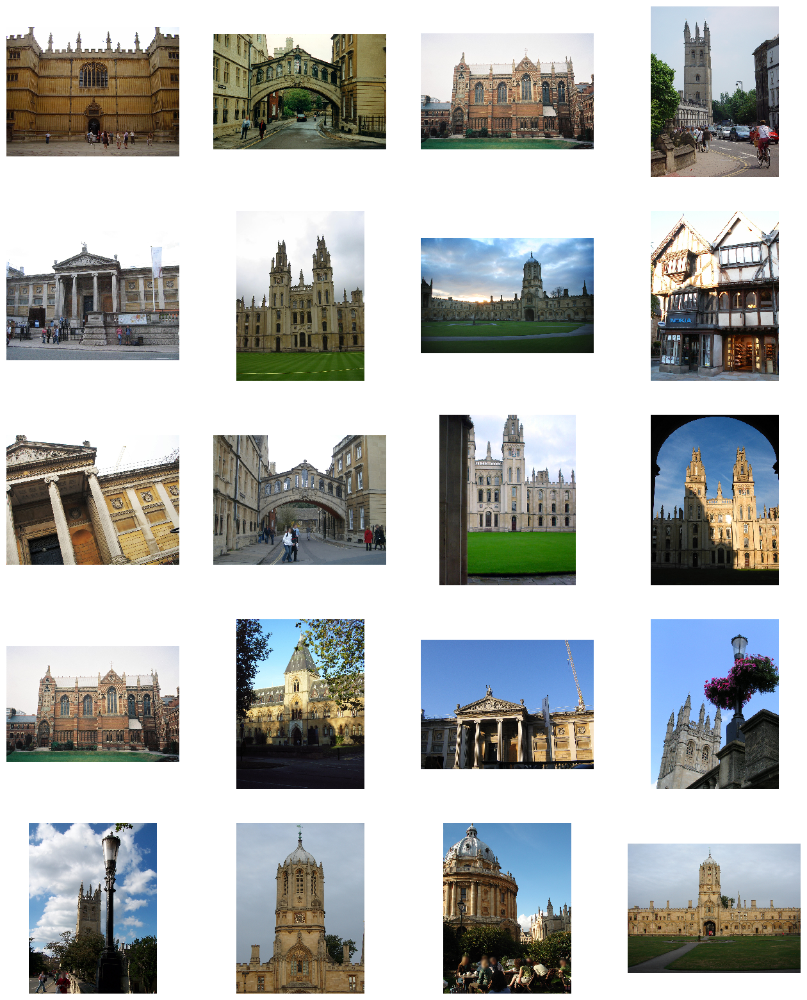

In [89]:
rows = 5
col = 4
fig, ax = plt.subplots(rows, col, figsize=(4 * col, 4 * rows))

ds.return_indiv_labels = True

for e, l in enumerate(pool_other):
    ax[e // col, e % col].imshow(l, interpolation='none')
    #ax[e, i].set_title(l[5][i][0] if l[3].item() != i else l[5][i][0] + ' -- GT')
    if e == (rows * col - 1):
        break
no_axes(ax)

plt.show()

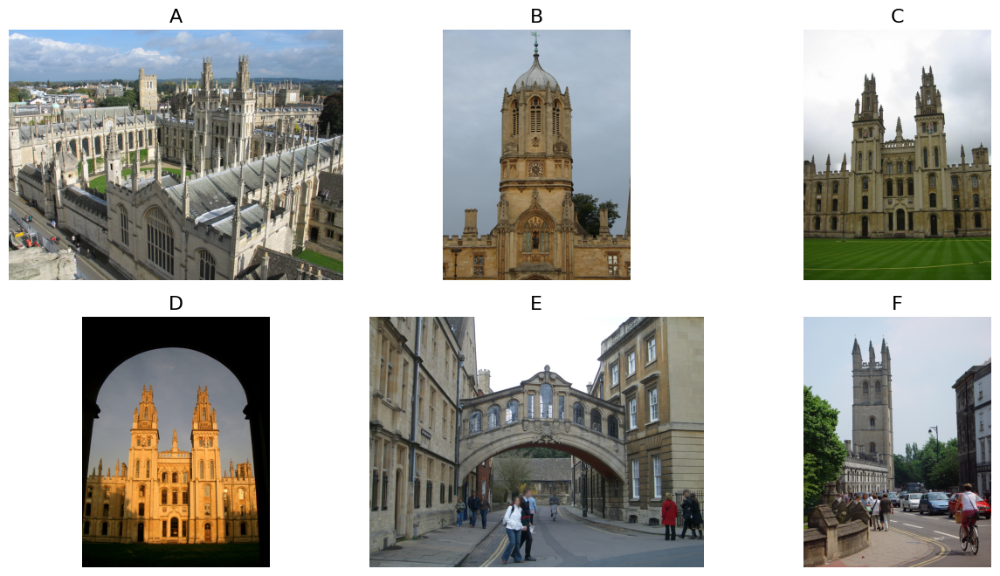

In [107]:
l = ds[i]
fs = 16

fig, ax = plt.subplots(2, 3, figsize=(16, 8))

ax[0, 0].imshow(pool[6])
ax[0, 1].imshow(pool_other[17])
ax[0, 2].imshow(pool[12])
ax[1, 0].imshow(pool[2])
ax[1, 1].imshow(pool_other[9])
ax[1, 2].imshow(pool_other[3])
ax[0, 0].set_title('A', fontsize=fs)
ax[0, 1].set_title('B', fontsize=fs)
ax[0, 2].set_title('C', fontsize=fs)
ax[1, 0].set_title('D', fontsize=fs)
ax[1, 1].set_title('E', fontsize=fs)
ax[1, 2].set_title('F', fontsize=fs)

no_axes(ax)
#fig.suptitle(f'idx={i} prompt={l[3][:100]}')
plt.subplots_adjust(wspace=0, hspace=.15
                    )

no_axes(ax)

plt.show()